## Início

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

Funções Auxiliares

In [22]:
def distancia_euclidiana(x1, x2):
    return np.sqrt(np.sum((x1 - x2) ** 2))

def inicializar_centroides(X, k):
    indices = np.random.choice(len(X), k, replace=False)
    return X.iloc[indices].to_numpy()

def atribuir_clusters(X, centróides):
    distancias = np.apply_along_axis(lambda x: np.apply_along_axis(lambda c: distancia_euclidiana(x, c), 1, centróides), 1, X.to_numpy())
    return np.argmin(distancias, axis=1)

def atualizar_centroides(X, clusters, k):
    novos_centroides = np.zeros((k, X.shape[1]))
    for i in range(k):
        novos_centroides[i] = np.mean(X.iloc[clusters == i], axis=0)
    return novos_centroides

Preparação dos Dados

In [23]:
# Leitura dos arquivos
dados_treino = pd.read_csv('nba_treino.csv')
dados_teste = pd.read_csv('nba_teste.csv')

# Separação dos dados de treino
X_treino = dados_treino.drop('TARGET_5Yrs', axis=1)
y_treino = dados_treino['TARGET_5Yrs']

# Separação dos dados de teste
X_teste = dados_teste.drop('TARGET_5Yrs', axis=1)
y_teste = dados_teste['TARGET_5Yrs']

## KNN

O algoritmo k-NN (k-Nearest Neighbors) classifica uma instância com base nas classes das instâncias mais próximas no espaço multidimensional. Calcula as distâncias euclidianas, seleciona os k vizinhos mais próximos e atribui a classe mais frequente como predição.s.

In [24]:
def knn(X_treino, y_teste, X_teste, k):
    predicoes = []

    for i in range(len(X_teste)):
        distancias = [distancia_euclidiana(X_teste.iloc[i], X_treino.iloc[j]) for j in range(len(X_treino))]
        indices_vizinhos = np.argsort(distancias)[:k]
        labels_vizinhos = [y_treino.iloc[idx] for idx in indices_vizinhos]

        # Usa a classe mais frequente como predição
        classe_mais_frequente = max(set(labels_vizinhos), key=labels_vizinhos.count)
        predicoes.append(classe_mais_frequente)

    return np.array(predicoes)

In [25]:
valores_knn = [2, 10, 50, 100]
resultados_knn_custom = []
resultados_knn_sklearn = []

for k in valores_knn:
    # kNN Customizado
    predicoes_custom = knn(X_treino, y_treino, X_teste, k)
    matriz_confusao_custom = confusion_matrix(y_teste, predicoes_custom)

    # Scikit-learn kNN
    knn_sklearn = KNeighborsClassifier(n_neighbors=k)
    knn_sklearn.fit(X_treino, y_treino)
    predicoes_sklearn = knn_sklearn.predict(X_teste)
    matriz_confusao_sklearn = confusion_matrix(y_teste, predicoes_sklearn)

    # Calcula métricas para o kNN customizado
    acuracia_custom = accuracy_score(y_teste, predicoes_custom)
    precisao_custom = precision_score(y_teste, predicoes_custom)
    revocacao_custom = recall_score(y_teste, predicoes_custom)
    f1_custom = f1_score(y_teste, predicoes_custom)

    # Calcula métricas para o kNN do scikit-learn
    acuracia_sklearn = accuracy_score(y_teste, predicoes_sklearn)
    precisao_sklearn = precision_score(y_teste, predicoes_sklearn)
    revocacao_sklearn = recall_score(y_teste, predicoes_sklearn)
    f1_sklearn = f1_score(y_teste, predicoes_sklearn)

    resultados_knn_custom.append({'k': k, 'Matriz de Confusão': matriz_confusao_custom, 'Acurácia': acuracia_custom, 'Precisão': precisao_custom, 'Revocação': revocacao_custom, 'F1 Score': f1_custom})
    resultados_knn_sklearn.append({'k': k, 'Matriz de Confusão': matriz_confusao_sklearn, 'Acurácia': acuracia_sklearn, 'Precisão': precisao_sklearn, 'Revocação': revocacao_sklearn, 'F1 Score': f1_sklearn})

# Cria DataFrames com os resultados
df_resultados_custom = pd.DataFrame(resultados_knn_custom)
df_resultados_sklearn = pd.DataFrame(resultados_knn_sklearn)

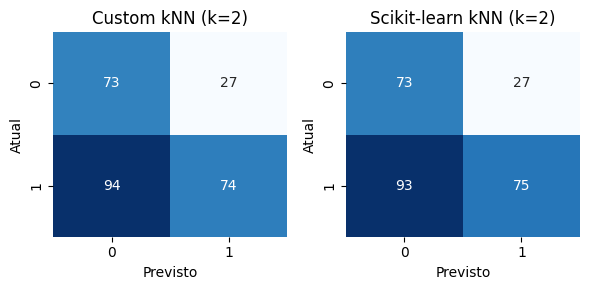

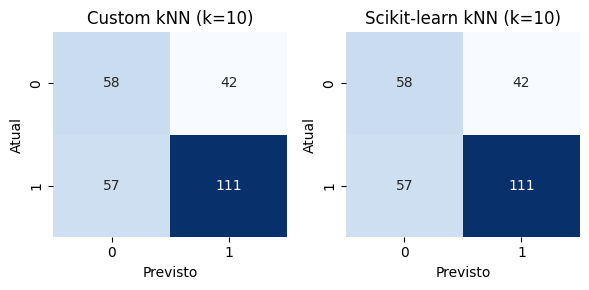

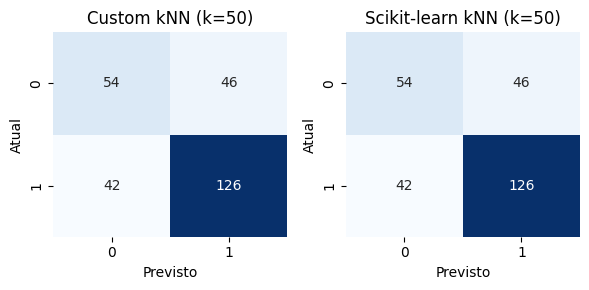

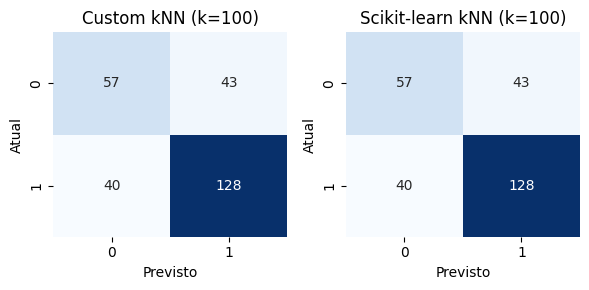

In [50]:
for i, k in enumerate(valores_knn, 1):
    # Custom kNN
    matriz_confusao_custom = resultados_knn_custom[i-1]['Matriz de Confusão']
    plt.figure(figsize=(6, 3))

    # Subplot for Custom kNN
    plt.subplot(1, 2, 1)
    sns.heatmap(matriz_confusao_custom, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.title(f'Custom kNN (k={k})')
    plt.xlabel('Previsto')
    plt.ylabel('Atual')

    # Subplot for Scikit-learn kNN
    plt.subplot(1, 2, 2)
    knn_sklearn = KNeighborsClassifier(n_neighbors=k)
    knn_sklearn.fit(X_treino, y_treino)
    predicoes_sklearn = knn_sklearn.predict(X_teste)
    matriz_confusao_sklearn = confusion_matrix(y_teste, predicoes_sklearn)
    sns.heatmap(matriz_confusao_sklearn, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.title(f'Scikit-learn kNN (k={k})')
    plt.xlabel('Previsto')
    plt.ylabel('Atual')

    plt.tight_layout()
    plt.show()

- Para k=2, as matrizes de confusão são praticamente idênticas e tem os valores mais distribuídos.
- Para k=10, k=50 e k=100, as matrizes são idênticas e os valores vão se concentrando na diagonal, indicando uma convergência do algoritmo.

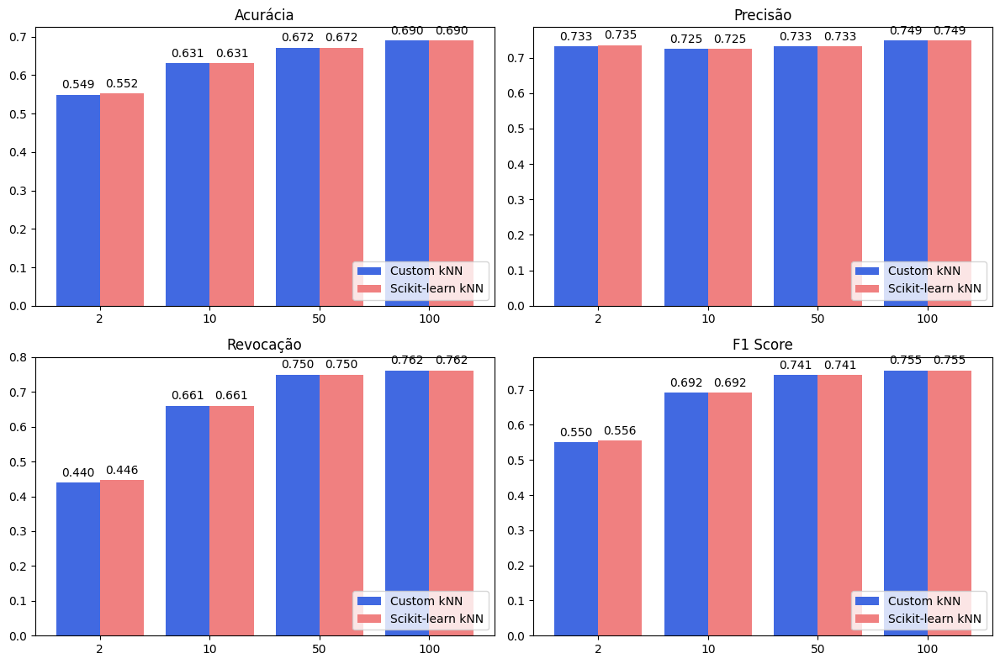

In [49]:
# Configura as cores para cada fonte
cores = {'Custom kNN': 'royalblue', 'Scikit-learn kNN': 'lightcoral'}

# Cria uma figura com subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Acurácia
bar_width = 0.4
bar_positions_custom = np.arange(len(df_resultados_custom['k']))
bar_positions_sklearn = np.arange(len(df_resultados_sklearn['k'])) + bar_width

axs[0, 0].bar(bar_positions_custom,  df_resultados_custom['Acurácia'],  color=cores['Custom kNN'],       width=bar_width, label='Custom kNN')
axs[0, 0].bar(bar_positions_sklearn, df_resultados_sklearn['Acurácia'], color=cores['Scikit-learn kNN'], width=bar_width, label='Scikit-learn kNN')
axs[0, 0].set_title('Acurácia')
axs[0, 0].set_xticks(bar_positions_custom + bar_width / 2)
axs[0, 0].set_xticklabels(df_resultados_custom['k'])
axs[0, 0].legend(loc='lower right')

# Precisão
axs[0, 1].bar(bar_positions_custom,  df_resultados_custom['Precisão'],  color=cores['Custom kNN'],       width=bar_width, label='Custom kNN')
axs[0, 1].bar(bar_positions_sklearn, df_resultados_sklearn['Precisão'], color=cores['Scikit-learn kNN'], width=bar_width, label='Scikit-learn kNN')
axs[0, 1].set_title('Precisão')
axs[0, 1].set_xticks(bar_positions_custom + bar_width / 2)
axs[0, 1].set_xticklabels(df_resultados_custom['k'])
axs[0, 1].legend(loc='lower right')

# Revocação
axs[1, 0].bar(bar_positions_custom,  df_resultados_custom['Revocação'],  color=cores['Custom kNN'],       width=bar_width, label='Custom kNN')
axs[1, 0].bar(bar_positions_sklearn, df_resultados_sklearn['Revocação'], color=cores['Scikit-learn kNN'], width=bar_width, label='Scikit-learn kNN')
axs[1, 0].set_title('Revocação')
axs[1, 0].set_xticks(bar_positions_custom + bar_width / 2)
axs[1, 0].set_xticklabels(df_resultados_custom['k'])
axs[1, 0].legend(loc='lower right')

# F1 Score
axs[1, 1].bar(bar_positions_custom,  df_resultados_custom['F1 Score'],  color=cores['Custom kNN'],       width=bar_width, label='Custom kNN')
axs[1, 1].bar(bar_positions_sklearn, df_resultados_sklearn['F1 Score'], color=cores['Scikit-learn kNN'], width=bar_width, label='Scikit-learn kNN')
axs[1, 1].set_title('F1 Score')
axs[1, 1].set_xticks(bar_positions_custom + bar_width / 2)
axs[1, 1].set_xticklabels(df_resultados_custom['k'])
axs[1, 1].legend(loc='lower right')

# Adicione rótulos com os valores no topo das barras
for ax in axs.flat:
    for bar in ax.patches:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, f'{bar.get_height():.3f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


- Temos que o código implementado tem desempenho bem próximo ao do Scikit-learn, tendo somente uma pequena diferença para k=2.
- A precisão se mantém praticamente constante, enquanto a acurácia, a revocação e o F1 crescem junto com o valor de k.

## K-Means

O algoritmo k-Means agrupa dados em k clusters. Inicialmente, atribui centróides aleatórios, itera entre atribuir instâncias aos clusters mais próximos e recalcular os centróides até convergir ou atingir o número máximo de iterações. Cria clusters com instâncias semelhantes.

In [7]:
def kmeans(X, k, max_iter=100):
    # Inicializar centróides aleatoriamente
    centróides = inicializar_centroides(X, k)

    for _ in range(max_iter):
        # Atribuir instâncias aos clusters
        clusters = atribuir_clusters(X, centróides)

        # Atualizar centróides
        novos_centroides = atualizar_centroides(X, clusters, k)

        # Verificar convergência
        if np.all(centróides == novos_centroides):
            break

        centróides = novos_centroides

    return clusters, centróides

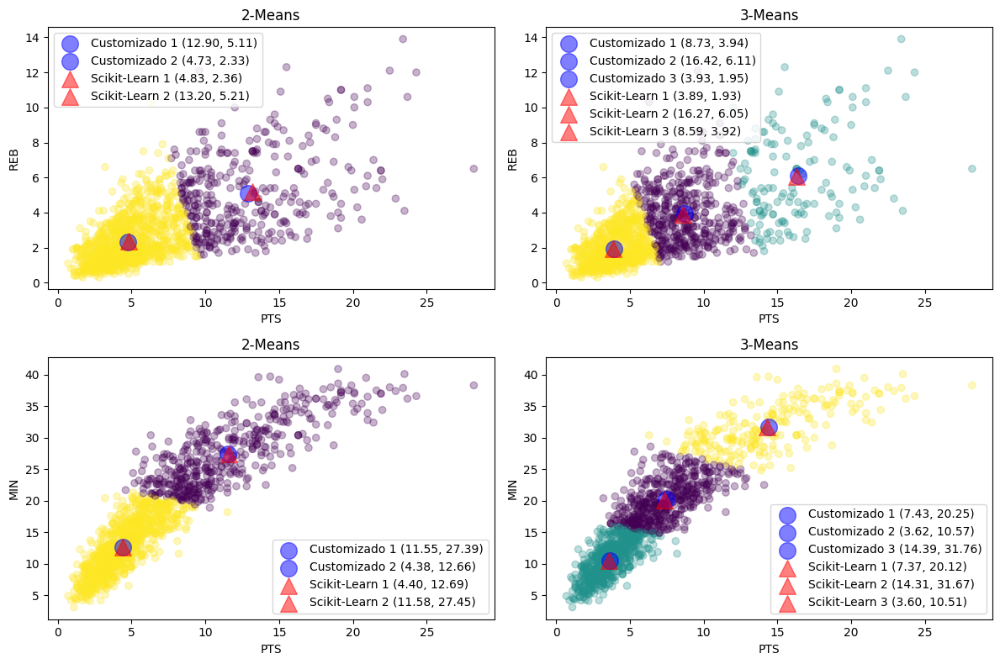

In [8]:
# Concatena dados de treino e teste
dados = pd.concat([dados_treino, dados_teste])

valores_kmeans = [2, 3]
resultados_kmeans_custom = []
resultados_kmeans_sklearn = []

variaveis = ['REB', 'MIN']

for i in range(2):
    for k in valores_kmeans:
        # Implementação Customizada
        clusters_custom, centroides_custom = kmeans(dados[[variaveis[i], 'PTS']], k)
        resultados_kmeans_custom.append({'variavel': variaveis[i], 'k': k, 'Clusters': clusters_custom, 'Centroides': centroides_custom, 'Algoritmo': 'Custom'})

        # Scikit-learn
        kmeans_sklearn = KMeans(n_clusters=k, n_init=10, random_state=42)
        kmeans_sklearn.fit(dados[[variaveis[i], 'PTS']])
        clusters_sklearn = kmeans_sklearn.labels_
        centroides_sklearn = kmeans_sklearn.cluster_centers_
        resultados_kmeans_sklearn.append({'variavel': variaveis[i], 'k': k, 'Clusters': clusters_sklearn, 'Centroides': centroides_sklearn, 'Algoritmo': 'Scikit-Learn'})

plt.figure(figsize=(12, 8))

# Implementação Customizada
for i in range(2):    
    plt.subplot(2, 2, 2*i+1)
    resultado_kmeans_custom = resultados_kmeans_custom[i * len(valores_kmeans)]
    k_custom = resultado_kmeans_custom['k']
    clusters_custom = resultado_kmeans_custom['Clusters']
    centroides_custom = resultado_kmeans_custom['Centroides']
    
    plt.scatter(dados['PTS'], dados[variaveis[i]], c=clusters_custom, cmap='viridis', alpha=0.3)
    for j, (x, y) in enumerate(zip(centroides_custom[:, 1], centroides_custom[:, 0])):
        plt.scatter(x, y, c='blue', marker='o', s=200, alpha=0.5, label=f'Customizado {j+1} ({x:.2f}, {y:.2f})')
    
    plt.title(f'{k_custom}-Means')
    plt.xlabel('PTS')
    plt.ylabel(variaveis[i])
    plt.legend()

    plt.subplot(2, 2, 2*i+2)
    resultado_kmeans_custom = resultados_kmeans_custom[i * len(valores_kmeans) + 1]
    k_custom = resultado_kmeans_custom['k']
    clusters_custom = resultado_kmeans_custom['Clusters']
    centroides_custom = resultado_kmeans_custom['Centroides']
    
    plt.scatter(dados['PTS'], dados[variaveis[i]], c=clusters_custom, cmap='viridis', alpha=0.3)
    for j, (x, y) in enumerate(zip(centroides_custom[:, 1], centroides_custom[:, 0])):
        plt.scatter(x, y, c='blue', marker='o', s=200, alpha=0.5, label=f'Customizado {j+1} ({x:.2f}, {y:.2f})')
    
    plt.title(f'{k_custom}-Means')
    plt.xlabel('PTS')
    plt.ylabel(variaveis[i])
    plt.legend()

# Scikit-learn
for i in range(2):    
    plt.subplot(2, 2, 2*i+1)
    resultado_kmeans_sklearn = resultados_kmeans_sklearn[i * len(valores_kmeans)]
    k_sklearn = resultado_kmeans_sklearn['k']
    centroides_sklearn = resultado_kmeans_sklearn['Centroides']
    
    for j, (x, y) in enumerate(zip(centroides_sklearn[:, 1], centroides_sklearn[:, 0])):
        plt.scatter(x, y, c='red', marker='^', s=200, alpha=0.5, label=f'Scikit-Learn {j+1} ({x:.2f}, {y:.2f})')
    plt.legend()
    
    plt.subplot(2, 2, 2*i+2)
    resultado_kmeans_sklearn = resultados_kmeans_sklearn[i * len(valores_kmeans) + 1]
    k_sklearn = resultado_kmeans_sklearn['k']
    centroides_sklearn = resultado_kmeans_sklearn['Centroides']
    
    for j, (x, y) in enumerate(zip(centroides_sklearn[:, 1], centroides_sklearn[:, 0])):
        plt.scatter(x, y, c='red', marker='^', s=200, alpha=0.5, label=f'Scikit-Learn {j+1} ({x:.2f}, {y:.2f})')
    plt.legend()

plt.tight_layout()
plt.show()

- Os gráficos acima mostram que os centroides obtidos na implementação customizada são bem próximos dos da implementação do Scikit-learn.
- Os algoritmos conseguem agrupar bem os dados, mas a separação não tem nenhum significado importante a priori.
- Pode ser feito a posteriori algum estudo para compreender possíveis significados destes agrupamentos.

## Argumento Extra

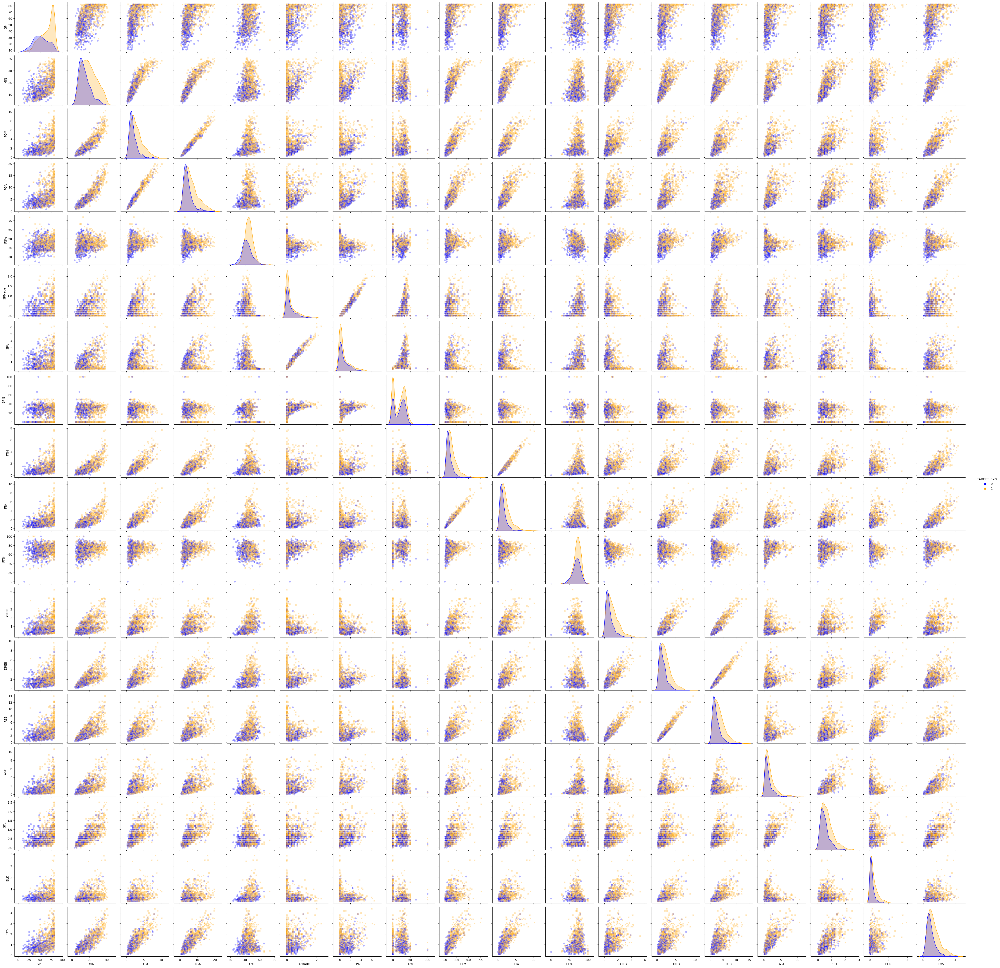

In [9]:
# Agrupa por TARGET_5Yrs
grupos_por_target = dados.groupby('TARGET_5Yrs')

# Armazena os resultados
valores_kmeans = [2]
resultados_kmeans_custom = []
resultados_kmeans_sklearn = []

# Obtém todas as variáveis do conjunto de dados
todas_variaveis = dados.columns.drop(['TARGET_5Yrs', 'PTS'])
num_variaveis = len(todas_variaveis)

# Cores para os clusters
cores = ['blue', 'orange']

for i, variavel in enumerate(todas_variaveis):
    for k in valores_kmeans:
        for target, grupo in grupos_por_target:
            # Implementação
            clusters_custom, centroides_custom = kmeans(grupo[[variavel, 'PTS']], k)
            resultados_kmeans_custom.append({'variavel': variavel, 'k': k, 'Clusters': clusters_custom, 'Algoritmo': 'Custom', 'Target': target})

            # Scikit-learn
            kmeans_sklearn = KMeans(n_clusters=k, n_init=10, random_state=42)
            kmeans_sklearn.fit(grupo[[variavel, 'PTS']])
            clusters_sklearn = kmeans_sklearn.labels_
            resultados_kmeans_sklearn.append({'variavel': variavel, 'k': k, 'Clusters': clusters_sklearn, 'Algoritmo': 'Scikit-Learn', 'Target': target})

for k in valores_kmeans:
    sns.pairplot(data=dados, hue='TARGET_5Yrs', vars=todas_variaveis, palette={0: 'blue', 1: 'orange'}, markers=["o", "X"], plot_kws={'alpha': 0.3})
    plt.show()

- Os gráficos acima mostram que nenhum par de variáveis separa bem os jogadores para a variável TARGET_5Yrs.
- Foi usado somente k=2 pois TARGET_5Yrs é uma variável binária, não fazendo sentindo outros valores de k.